<b> Name: Aishwarya Bhavsar</b><br>
<b> CSULB ID: 029371509 </b><br>
<b>CECS 551</b><br>
<b>Assignment 8</b><br>
<b>Develop face recognition software using pre-trained YOLO V3 and Facenet model.<br> Please
note that you don’t need to implement and train a model.</b><br>


<b><font color = 'purple'>(f) (25 points) Implement a Python program imageFinder.py.<br>
• Input: An image of a celebrity in the selected dataset.<br>
• Intermediate steps<br>
1. Using image2vect.py, compute Euclidean distances between the embedding vector of the input image and the embedding vectors of other images
in the selected dataset. You will have 1, 199 Euclidean distances.<br>
2. Consider a hyper-parameter τ . The other images will be recognized as the
same celebrity of the input image if the Euclidean distance is less than τ .<br>
• Output: A list of image files recognized as the same celebrity of the input
image.


<b><font color='red'>Install Hub and Torch</b>

In [ ]:
!pip3 install hub==2.0.4 && torch==1.8.1

     |████████████████████████████████| 127 kB 5.4 MB/s 
     |████████████████████████████████| 46 kB 3.2 MB/s 
     |████████████████████████████████| 3.0 MB 47.6 MB/s 
     |████████████████████████████████| 81 kB 9.6 MB/s 
     |████████████████████████████████| 132 kB 46.9 MB/s 
     |████████████████████████████████| 8.7 MB 31.1 MB/s 
     |████████████████████████████████| 79 kB 6.8 MB/s 
     |████████████████████████████████| 138 kB 45.3 MB/s 
     |████████████████████████████████| 43 kB 1.5 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 91 kB 7.5 MB/s 
     |████████████████████████████████| 90 kB 8.3 MB/s 
     |████████████████████████████████| 359 kB 34.1 MB/s 
     |████████████████████████████████| 59 kB 5.7 MB/s 
     |████████████████████████████████| 47 kB 3.6 MB/s 
     |████████████████████████████████| 65 kB 3.2 MB/s 
     |████████████████████████████████| 127 kB 45.9 MB/s 
  Attempting uninstall: urllib3
   

<b><font color='red'>Import Packages And Libraries</b>

In [ ]:
import numpy as np
import hub
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torch
from torchsummary import summary
import torchvision.models as models
import glob
from tqdm import tqdm
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline

NumExpr defaulting to 2 threads.


In [ ]:
print(hub.__version__)

2.0.4


In [ ]:
print(torch.__version__)

1.10.0+cu111


<b><font color='red'>The glob module is used to retrieve files/pathnames matching a specified pattern. 

In [ ]:
import glob
data_dir = '/content/drive/MyDrive/Selected_Dataset'

list_imgs = glob.glob(data_dir + "/**/*.jpg")
print(f"There are {len(list_imgs)} images in the dataset {data_dir}")

There are 1200 images in the dataset /content/drive/MyDrive/Selected_Dataset


 <b>Resized And Batched Dataset<b>

In [ ]:
# create dataloader with required transforms 
tc = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor()              
    ])

In [ ]:
image_datasets = datasets.ImageFolder(data_dir, transform=tc)
dloader = torch.utils.data.DataLoader(image_datasets, batch_size=10, shuffle=False)

<b><font color='red'>Length Of Image Datasets</b>

In [ ]:
print(len(image_datasets))

1200


<b><font color='red'>Creating tensors to store the vector embeddings

torch.Size([256, 256, 3])
tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.2353, 0.1804, 0.1529],
         [0.0000, 0.0000, 0.0000,  ..., 0.2824, 0.2275, 0.1882],
         [0.0000, 0.0000, 0.0000,  ..., 0.2824, 0.2275, 0.1882]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.1608, 0.1137, 0.0863],
         [0.0000, 0.0000, 0.0000,  ..., 0.2039, 0.1608, 0.1216],
         [0.0000, 0.0000, 0.0000,  ..., 0.2078, 0.1608, 0.1216]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000

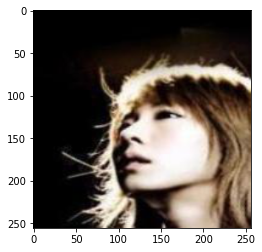

In [ ]:
for img, label in dloader:
  print(np.transpose(img[0], (1,2,0)).shape)
  print(img[0])
  plt.imshow((img[0].detach().numpy().transpose(1, 2, 0)*255).astype(np.uint8))
  plt.show()
  break

Pytorch default backend for images are Pillow, and when you use ToTensor()class, PyTorch automatically converts all images into [0,1] so no need to normalize the images here.

In [ ]:
len(image_datasets)

1200

**Generate Embeddings**

<b><font color = 'red'>Face embeddings : <font color = 'black'>converting a face image into numerical data.<br>The data is represented as a vector.<br> The closer the embeddings are to each other in the latent space, the more likely they are of the same person.

In [ ]:
def copy_embeddings(m, i, o):
    """Copy embeddings from the penultimate layer.
    """
    o = o[:, :, 0, 0].detach().numpy().tolist()
    outputs.append(o)

In [ ]:
# fetch pretrained model
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet18', pretrained=True)

Downloading: "https://github.com/pytorch/vision/archive/v0.10.0.zip" to /root/.cache/torch/hub/v0.10.0.zip
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

In [ ]:
# Select the desired layer
layer = model._modules.get('avgpool')
# attach hook to the penulimate layer
_ = layer.register_forward_hook(copy_embeddings)

In [ ]:
outputs = []  # list of embeddings
model.eval() # Inference mode

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

<b><font color='red'> Image embeddings saved in outputs

In [ ]:
# Generate image's embeddings for all images in dloader and saves 
# them in the list outputs
for X, y in dloader:
    _ = model(X)

In [ ]:
len(outputs)

120

<b><font color='red'>Flatten The Embeddings :  <font color='black'>converting the data into a 1-dimensional array for inputting it to the next layer.

In [ ]:
# flatten list of embeddings to remove batches
list_embeddings = [item for sublist in outputs for item in sublist]
print(len(list_embeddings))

1200


<b><font color='red'>The assert statement <font color='black'>is used to continue the execute if the given condition evaluates to True. <br>If the assert condition evaluates to False, then it raises the AssertionError exception with the specified error message.

In [ ]:
assert len(list_embeddings) == len(image_datasets)

<b><font color='red'> The dimension of each vector embedding is 512 * 1

In [ ]:
np.array(list_embeddings[0]).shape

(512,)

In [ ]:
len(image_datasets)

1200

<b><font color='red'>Printing all the 1199 embeddings <b><br>
Runtime changed from Standard Runtime to GPU Runtime.<br>


In [ ]:
print(outputs)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
print(outputs[0:20])

[[[1.0494840145111084, 0.6327646970748901, 0.2011743038892746, 1.1638250350952148, 0.6332703232765198, 0.8214037418365479, 0.8691402673721313, 1.550246238708496, 0.1799108386039734, 1.4215855598449707, 0.21836519241333008, 0.5425021052360535, 0.020819468423724174, 0.4297272562980652, 0.11338071525096893, 0.8681647181510925, 0.10835275053977966, 1.376829981803894, 0.16498464345932007, 1.8382054567337036, 1.056017279624939, 2.8908708095550537, 1.3998883962631226, 0.23012641072273254, 0.5983468294143677, 0.38922733068466187, 0.16918915510177612, 1.8237642049789429, 1.7735164165496826, 0.22906415164470673, 0.6229870319366455, 1.8890633583068848, 0.544605016708374, 1.698947548866272, 0.11501239240169525, 0.48368072509765625, 0.08279095590114594, 0.139384463429451, 0.2099328190088272, 0.12207639217376709, 0.46822959184646606, 0.584237813949585, 0.5868879556655884, 1.2146669626235962, 0.699407160282135, 0.6387356519699097, 0.7951008081436157, 0.7783321738243103, 1.0446209907531738, 1.43022489

In [ ]:
print(outputs[21:40])

[[[0.9443720579147339, 0.6326521635055542, 0.9771186113357544, 0.8652228116989136, 0.09615599364042282, 0.8506078124046326, 0.07054297626018524, 0.9175180792808533, 0.5829752683639526, 0.3964271545410156, 0.44252240657806396, 0.26470962166786194, 0.04783784598112106, 0.24287442862987518, 0.09592722356319427, 0.5355536937713623, 0.10492798686027527, 0.28083691000938416, 0.6149251461029053, 0.706179141998291, 0.2357640564441681, 0.2722456455230713, 0.5132141709327698, 0.11836785823106766, 0.0770070031285286, 0.5392497181892395, 0.8046717643737793, 1.4398729801177979, 0.6576403975486755, 0.24753645062446594, 0.8249150514602661, 1.2790701389312744, 0.6801742315292358, 0.366688072681427, 0.5380910038948059, 0.0319717638194561, 1.3480429649353027, 0.11337363719940186, 1.123895287513733, 0.07513084262609482, 0.48822221159935, 1.308090090751648, 0.2134731262922287, 0.48984360694885254, 0.435499906539917, 0.4844996929168701, 0.33553367853164673, 1.0131539106369019, 0.773230791091919, 1.73482394

In [ ]:
print(outputs[41:60])

[[[0.1647297888994217, 0.9427793622016907, 1.0196774005889893, 0.3096046447753906, 0.2662387490272522, 0.5165355205535889, 0.0783982202410698, 1.5104557275772095, 0.45950543880462646, 0.13436593115329742, 0.4748513996601105, 0.0317910872399807, 0.013795306906104088, 0.5579217076301575, 0.021305356174707413, 1.0030962228775024, 0.09456171095371246, 0.2396768033504486, 0.5094914436340332, 0.9115981459617615, 0.14960528910160065, 0.5196685194969177, 0.6362252235412598, 0.3516559302806854, 0.09286066889762878, 0.5281480550765991, 0.6756472587585449, 1.5651600360870361, 1.3710802793502808, 0.09363400191068649, 0.6039919257164001, 0.9048901796340942, 0.6270681023597717, 0.3534986972808838, 0.5182316899299622, 0.09426309168338776, 0.857897162437439, 0.048256102949380875, 1.910902500152588, 0.02530168555676937, 0.2494886815547943, 0.80977463722229, 0.19760091602802277, 0.7505097389221191, 0.4662410616874695, 0.5046854019165039, 0.2097909301519394, 1.2549817562103271, 0.9158193469047546, 2.1638

In [ ]:
print(outputs[61:80])

[[[0.8808468580245972, 0.2817220389842987, 0.6589202284812927, 0.5380346775054932, 0.0768187940120697, 0.5770659446716309, 0.2798401713371277, 0.35886451601982117, 0.42919841408729553, 1.1271687746047974, 0.02807527780532837, 0.713806688785553, 0.13693468272686005, 0.3519083261489868, 0.06381581723690033, 0.6125307083129883, 0.3118492364883423, 0.25560349225997925, 0.17200860381126404, 0.910437285900116, 0.11105678975582123, 0.7399535179138184, 0.3660866916179657, 0.25273624062538147, 0.3540026545524597, 0.3369329273700714, 0.1773340106010437, 1.16229248046875, 2.416533946990967, 0.8432167768478394, 0.26114121079444885, 1.0669188499450684, 0.9370607137680054, 0.9041603803634644, 0.19725468754768372, 0.07720540463924408, 1.0513122081756592, 0.15494155883789062, 1.5950517654418945, 0.09229422360658646, 1.1005346775054932, 1.0135846138000488, 0.5967426300048828, 0.5141697525978088, 0.5781958699226379, 0.39577192068099976, 0.33028632402420044, 3.516388416290283, 0.21589519083499908, 1.8831

In [ ]:
print(outputs[81:100])

[[[1.8219051361083984, 0.5163203477859497, 0.2979862093925476, 1.172698974609375, 0.6174251437187195, 1.1026525497436523, 0.29500290751457214, 1.081676959991455, 0.41054701805114746, 0.4733063876628876, 0.5680010914802551, 0.2242506444454193, 0.027662305161356926, 0.23497410118579865, 0.3586706817150116, 0.16611094772815704, 0.046288855373859406, 0.29919683933258057, 0.16384699940681458, 0.659018874168396, 0.3000790476799011, 0.7276759147644043, 0.7955241799354553, 0.26003843545913696, 0.15149517357349396, 0.023629961535334587, 0.19115284085273743, 0.9776898622512817, 2.061177968978882, 0.07897904515266418, 0.7034196853637695, 2.995496988296509, 0.7540475726127625, 0.8260102272033691, 0.8181456923484802, 0.08104299008846283, 0.8769522905349731, 0.06688913702964783, 0.4509022831916809, 0.29057422280311584, 1.252774715423584, 0.24748313426971436, 0.6180163025856018, 0.2751723825931549, 0.36245352029800415, 1.0823980569839478, 0.22394102811813354, 1.9378886222839355, 1.8455089330673218, 1

In [ ]:
print(outputs[101:120])

[[[0.31212252378463745, 0.23087497055530548, 0.26736390590667725, 0.7166630625724792, 0.05581827089190483, 0.35032278299331665, 0.013290807604789734, 0.33293965458869934, 0.2566521167755127, 0.5107805132865906, 0.07992719113826752, 0.15772771835327148, 0.05961351841688156, 0.1436123251914978, 0.4832437038421631, 0.599324643611908, 0.06245720013976097, 0.5226916074752808, 0.22301582992076874, 0.5901603698730469, 0.1001543179154396, 0.539337694644928, 0.37899380922317505, 0.059474434703588486, 0.13260714709758759, 0.03530075401067734, 0.3726140558719635, 0.9245323538780212, 0.9205727577209473, 0.03964397311210632, 0.14198602735996246, 1.1976804733276367, 0.40721991658210754, 0.5766810178756714, 0.08418066054582596, 0.0, 0.9867646098136902, 0.24640502035617828, 1.047765851020813, 0.09173908829689026, 0.4570346176624298, 0.41189172863960266, 0.3569224774837494, 0.34745919704437256, 0.6054782271385193, 0.12443854659795761, 0.35761329531669617, 0.45025575160980225, 1.2751671075820923, 2.1196

In [ ]:
print(len(list_embeddings))

1200


<b>Embeddings of first cropped image from the selected dataset that we have created. <b>

In [ ]:
print(list_embeddings[0])

[1.0494840145111084, 0.6327646970748901, 0.2011743038892746, 1.1638250350952148, 0.6332703232765198, 0.8214037418365479, 0.8691402673721313, 1.550246238708496, 0.1799108386039734, 1.4215855598449707, 0.21836519241333008, 0.5425021052360535, 0.020819468423724174, 0.4297272562980652, 0.11338071525096893, 0.8681647181510925, 0.10835275053977966, 1.376829981803894, 0.16498464345932007, 1.8382054567337036, 1.056017279624939, 2.8908708095550537, 1.3998883962631226, 0.23012641072273254, 0.5983468294143677, 0.38922733068466187, 0.16918915510177612, 1.8237642049789429, 1.7735164165496826, 0.22906415164470673, 0.6229870319366455, 1.8890633583068848, 0.544605016708374, 1.698947548866272, 0.11501239240169525, 0.48368072509765625, 0.08279095590114594, 0.139384463429451, 0.2099328190088272, 0.12207639217376709, 0.46822959184646606, 0.584237813949585, 0.5868879556655884, 1.2146669626235962, 0.699407160282135, 0.6387356519699097, 0.7951008081436157, 0.7783321738243103, 1.0446209907531738, 1.4302248954

In [ ]:
print(len(list_embeddings[0]))

512


<b>Embeddings of second cropped image from the selected dataset that we have created. <b>

In [ ]:
print(list_embeddings[1])

[0.32974281907081604, 0.8566601872444153, 0.058949947357177734, 0.749071478843689, 0.2475096881389618, 0.5349194407463074, 0.27259308099746704, 0.9457840323448181, 0.3435244858264923, 0.48639580607414246, 1.6928975582122803, 0.09094968438148499, 0.24421706795692444, 0.9749136567115784, 0.07273349165916443, 0.7880626916885376, 0.27124127745628357, 0.38948965072631836, 0.5932008028030396, 0.8621469736099243, 0.6527864336967468, 0.7842466235160828, 0.7781548500061035, 0.5140019059181213, 0.26487812399864197, 0.2267717868089676, 0.21668437123298645, 2.2588722705841064, 1.4490424394607544, 0.08652989566326141, 0.6808711886405945, 1.4358775615692139, 0.5991301536560059, 1.166917085647583, 0.42041268944740295, 0.35622334480285645, 0.4235651195049286, 0.07447681576013565, 1.0138267278671265, 0.0062408968806266785, 0.1779082715511322, 1.1873148679733276, 0.3390568494796753, 0.5125161409378052, 1.4680943489074707, 0.4725766181945801, 0.2628471851348877, 0.9315266013145447, 1.6313927173614502, 1.

<b>Embeddings of third cropped image from the selected dataset that we have created.<b>

In [ ]:
print(list_embeddings[2])

[1.7011851072311401, 0.39483577013015747, 1.033357858657837, 0.26177459955215454, 0.11514241993427277, 0.5134443044662476, 0.16459503769874573, 0.6142996549606323, 0.9054591655731201, 1.3489958047866821, 0.13523899018764496, 0.46892961859703064, 0.38354256749153137, 0.4196684956550598, 0.44009578227996826, 0.35348910093307495, 0.005094544496387243, 0.1989448070526123, 0.27267199754714966, 0.7113571166992188, 0.5860069990158081, 0.02351139672100544, 0.5806487798690796, 0.33342576026916504, 0.11893156915903091, 0.020361725240945816, 0.6041272282600403, 2.074284076690674, 0.5756863951683044, 0.07624796777963638, 0.43560415506362915, 0.4656835198402405, 1.0379481315612793, 1.186259150505066, 1.639188528060913, 0.02034112811088562, 1.5499523878097534, 0.39446762204170227, 0.7238860726356506, 0.14745408296585083, 0.012081627734005451, 1.6521077156066895, 0.4354850947856903, 1.2405595779418945, 0.8138980865478516, 0.7165146470069885, 1.1438517570495605, 1.9378186464309692, 1.7012178897857666,

<b><font color='red'>Image Embeddings Vectors of 1200 cropped images from the Selected Dataset. <br>Each embedding vector has a length of 512.<br> 1 * 512 vector <br>
1 * 512 * 1200 

In [ ]:

# using for loop
a = list_embeddings
  
# printing the list using loop
for x in range(len(a)):
    print (a[x])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[1.595215916633606, 0.896139919757843, 0.3829038739204407, 1.0927252769470215, 0.4171511232852936, 0.3089693486690521, 0.13667063415050507, 1.207503080368042, 0.9058822989463806, 0.872187614440918, 0.5204693675041199, 0.3640657663345337, 0.03613918274641037, 0.6462207436561584, 0.32782840728759766, 0.8630824089050293, 0.10295207798480988, 0.1765664964914322, 0.5176323652267456, 0.8589568138122559, 0.11198189109563828, 0.19716382026672363, 1.1884464025497437, 0.5440242290496826, 0.35137563943862915, 0.13435445725917816, 0.5538656115531921, 1.0729585886001587, 1.3405202627182007, 0.1937103420495987, 0.8627961874008179, 1.4098175764083862, 1.478288173675537, 0.7518068552017212, 0.22196194529533386, 0.0003152343269903213, 1.1188435554504395, 0.07260551303625107, 1.3813676834106445, 0.13581660389900208, 0.4163808226585388, 1.2453984022140503, 0.2665773928165436, 0.13344033062458038, 0.41034969687461853, 0.5290948152542114, 0.06205660104751587, 1.2420140504837036, 0.9084072113037109, 3.05843

<b><font color='red'>1199 Euclidean distances <b><br>
The indexing starts from zero and ends on 1200-1 therefore we get 1199 Euclidean distances. 

In [ ]:
from scipy.spatial import distance

In [ ]:

# using for loop
a = list_embeddings
  
# printing the list using loop
for x in range(len(a)):
    print(distance.euclidean(a[x],a[x-1]))

15.255477973140366
13.308284858550515
10.944386163754464
11.9162972071459
12.242808540214265
14.519597915340547
15.064556109993775
10.491491781976704
11.902779072662932
11.381331722599525
15.50803935474357
13.180986546993502
15.013013015970973
14.770182753502827
11.030871686454432
12.715869067136753
12.072002500922158
12.023612720033855
13.211951578151332
14.46822072317722
13.80290835659984
13.868134450867334
12.858201763923361
11.90582318692057
13.225719223805225
10.054865835761722
11.964737408668467
14.474948905693113
15.632608767275238
13.54669530943164
12.508161709446329
12.575655317552004
13.664966535842686
8.824185706527995
9.362913269049868
8.034397464552773
10.293106520231104
10.494673782782172
10.943744906832798
11.53313848688373
8.916915624779135
7.914181750335219
8.180489866159467
8.571784002044494
13.822769731354148
12.727766693019914
9.673405881260798
9.091575334742954
11.944780807734078
11.883671035722083
16.137788875139425
17.68257308335085
8.815951298321766
8.3607661566

In [ ]:
print(len(a))

1200


<b><font color='red'>Send The Embeddings To Hub</b><br>
<b><font color = 'black'> Such large embeddings won't fit locally hence, we need to migrate them on the cloud.

In [ ]:
!activeloop login -u cecs551aishwaryabhavsar -p password123

Successfully logged in to Activeloop.


In [ ]:
import hub

platform_path = 'hub://cecs551aishwaryabhavsar/1200_selected_celebs_embeddings'
               
               
ds = hub.dataset(platform_path)

Your Hub dataset has been successfully created!


In [ ]:
hub_celeb_embeddings_path = 'hub://cecs551aishwaryabhavsar/1200_select_finalcelebas_embeddings'

In [ ]:
with hub.empty(hub_celeb_embeddings_path) as ds:
    # Create the tensors 
    ds.create_tensor('images', htype = 'image', sample_compression = 'jpeg')
    ds.create_tensor('embeddings')

    # Add arbitrary metadata - Optional
    ds.info.update(description = '1200 Celebrities Embeddings dataset')
    ds.images.info.update(camera_type = 'SLR')
    
    # Iterate through the images and their corresponding embeddings, and append them to hub dataset
    for i in tqdm(range(len(image_datasets))):
      img = image_datasets[i][0].detach().numpy().transpose(1, 2, 0)
      img = img * 255 # images are normalized
      img = img.astype(np.uint8)
      ds.images.append(img)  # Append to Hub Dataset
      ds.embeddings.append(list_embeddings[i]) # Append to Hub Dataset
                
# Long-term storage is updated at the end of the code block inside 'with'

Your Hub dataset has been successfully created!


100%|██████████| 1200/1200 [00:12<00:00, 95.45it/s]


<b><font color='red'> Image and its embeddings shown</b>

Image:
(256, 256, 3)


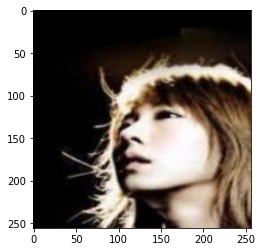

[1.04948401 0.6327647  0.2011743  1.16382504 0.63327032 0.82140374
 0.86914027 1.55024624 0.17991084 1.42158556]
Image:
(256, 256, 3)


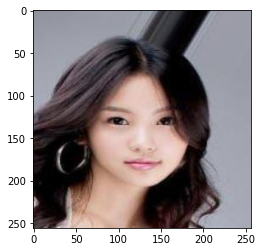

[0.32974282 0.85666019 0.05894995 0.74907148 0.24750969 0.53491944
 0.27259308 0.94578403 0.34352449 0.48639581]


In [ ]:
def show_image_in_ds(ds, idx=1):
    image = ds.images[idx].numpy()
    embedding = ds.embeddings[idx].numpy()
    print("Image:")
    print(image.shape)
    plt.imshow(image)
    plt.show()
    print(embedding[0:10]) # show only 10 first values of the image embedding

for i in range(2):
    show_image_in_ds(ds, i)

<b>Check the dataset was correctly sent to Hub<b>

hub://cecs551aishwaryabhavsar/1200_select_finalcelebas_embeddings loaded successfully.


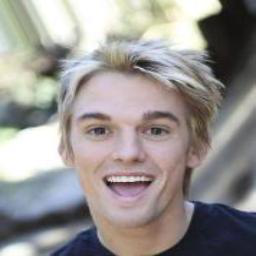

In [ ]:
ds_from_hub = hub.dataset(hub_celeb_embeddings_path)
Image.fromarray(ds_from_hub.images[47].numpy())

Image:
(256, 256, 3)


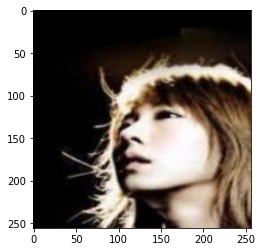

[1.04948401 0.6327647  0.2011743  1.16382504 0.63327032 0.82140374
 0.86914027 1.55024624 0.17991084 1.42158556]
Image:
(256, 256, 3)


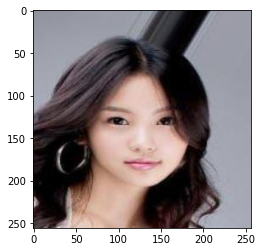

[0.32974282 0.85666019 0.05894995 0.74907148 0.24750969 0.53491944
 0.27259308 0.94578403 0.34352449 0.48639581]
Image:
(256, 256, 3)


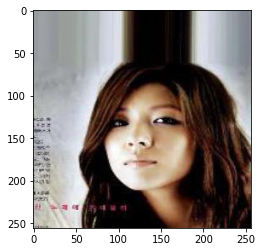

[1.70118511 0.39483577 1.03335786 0.2617746  0.11514242 0.5134443
 0.16459504 0.61429965 0.90545917 1.3489958 ]
Image:
(256, 256, 3)


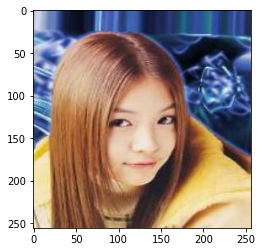

[0.98982775 0.41489366 0.8906697  0.55636096 0.22872707 0.71425837
 0.03102451 1.00883985 0.72298062 0.45910132]
Image:
(256, 256, 3)


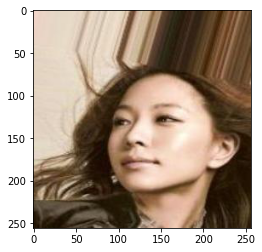

[0.1647     0.50006205 0.50203264 0.72303385 0.18444252 0.19682866
 0.37633708 1.70757902 0.30031973 0.88978106]
Image:
(256, 256, 3)


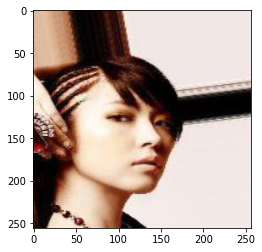

[1.0267663  0.08039597 0.63566649 0.61682695 1.4263947  0.60516715
 0.21998404 0.2633028  0.4737376  0.70029467]
Image:
(256, 256, 3)


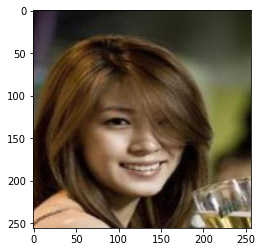

[0.05163532 0.37205422 0.38880911 0.97459954 0.15304106 0.50387228
 0.10598029 0.71975863 0.40511924 0.1445149 ]
Image:
(256, 256, 3)


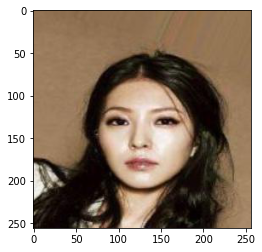

[1.06330156 0.46762061 0.09450768 0.6620239  0.13773502 0.27711257
 0.98024035 0.98189914 0.43953007 0.33534038]
Image:
(256, 256, 3)


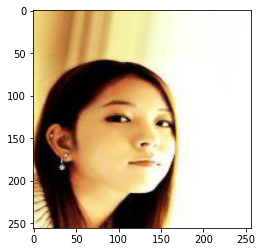

[1.59562707 0.46249476 0.03911376 0.39446762 0.16993265 0.3550584
 0.23322488 1.00237703 0.307399   1.25959039]
Image:
(256, 256, 3)


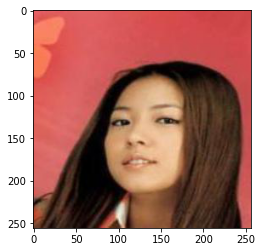

[2.12085915 0.31787953 0.02610606 1.17018962 0.14457464 1.28291631
 0.21855411 1.15833509 0.80211431 1.01049995]


In [ ]:
for i in range(10):
    show_image_in_ds(ds_from_hub, i)